<a href="https://colab.research.google.com/github/colvertG/scig/blob/main/notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Usando modelos de deep learning para clasificación de imágenes satelitales


In [1]:
import warnings
warnings.filterwarnings('ignore')

## Carga de los datos

In [2]:
!git clone https://github.com/colvertG/scig.git

fatal: destination path 'scig' already exists and is not an empty directory.


In [3]:
import pathlib
import os 
import random
import cv2
from skimage.io import imread
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

In [4]:
dir = pathlib.Path("/content/scig/images/")

dir_img = list(dir.glob(r"*/*.png"))

random.seed(1)
dir_img = random.sample(dir_img, len(dir_img)) 

In [5]:
#dir_img

In [6]:
X = []
for n in range(0,len(dir_img)):
    img = imread(dir_img[n])
    img_resized = cv2.resize(img,(256, 256))
    X.append(img_resized)

In [7]:
import numpy as np

In [8]:
X = np.stack(X)
X.shape

(999, 256, 256, 3)

In [9]:
etiquetas = []
for i in range(0,len(dir_img)):
    etiquetas.append(os.path.split(dir_img[i])[0].split('/')[-1])

In [10]:
#etiquetas

In [11]:
for n in list(set(etiquetas)):
    print("{}: {}".format(n,etiquetas.count(n)))

agricultural: 99
chaparral: 100
buildings: 100
airplane: 100
beach: 100
parkinglot: 100
river: 100
freeway: 100
forest: 100
harbor: 100


In [12]:
encode = LabelEncoder()
y = encode.fit_transform(etiquetas)

In [13]:
#y

In [14]:
dir_labels = {0:'agricultural', 1:'airplane', 2:'beach', 
              3:'buildings', 4:'chaparral', 5:'forest', 
              6:'freeway', 7:'harbor', 8:'parkinglot',
              9:'river'}

## Separando los conjuntos de datos



*   70% entrenamiento
*   10% validación
*   20% prueba




In [15]:
X_entrenamiento = X.astype('float16')[0:700] / 255 

X_validacion = X.astype('float16')[700:800] / 255 

X_prueba = X.astype('float16')[800:1000] / 255 

In [16]:
print("X entrenamiento:", X_entrenamiento.shape)
print("X validación:", X_validacion.shape)
print("X prueba:", X_prueba.shape)

X entrenamiento: (700, 256, 256, 3)
X validación: (100, 256, 256, 3)
X prueba: (199, 256, 256, 3)


In [17]:
y_entrenamiento = (y[0:700])
y_validacion = (y[700:800])
y_prueba = (y[800:1000])

In [18]:
#y_validacion

In [19]:
from tensorflow.keras.utils import to_categorical

In [20]:
y_entrenamiento = to_categorical(y_entrenamiento)
y_validacion = to_categorical(y_validacion)

In [21]:
#y_validacion

In [22]:
print("y entrenamiento:", y_entrenamiento.shape)
print("y validación:", y_validacion.shape)
print("y prueba:", y_prueba.shape)

y entrenamiento: (700, 10)
y validación: (100, 10)
y prueba: (199,)


## Importando la red neuronal convolucional VGG16



In [23]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.callbacks import TensorBoard

In [24]:
modelo_base = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

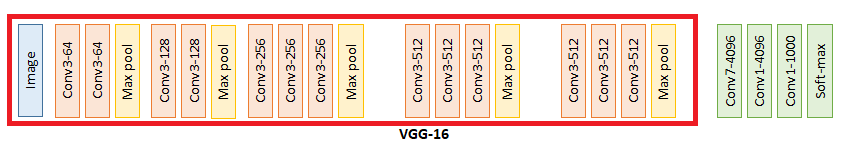

In [25]:
modelo_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [26]:
modelo_base.trainable = False

In [27]:
modelo_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

## Agregando capas 

In [28]:
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import optimizers

In [29]:
x = modelo_base.output
x = layers.GlobalAveragePooling2D()(x) 

In [30]:
x = layers.Dense(1024, activation='relu')(x)

In [31]:
pred = layers.Dense(10, activation='softmax')(x)

In [32]:
modelo = Model(inputs=modelo_base.input, outputs=pred)

In [33]:
modelo.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

## Entrenando el modelo

In [34]:
modelo.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=0.001),
              metrics=['accuracy'])

In [35]:
tensorboard_tl = TensorBoard(log_dir='logs/tl')

modelo.fit(X_entrenamiento, y_entrenamiento, 
           validation_data=(X_validacion, y_validacion), 
           epochs=10, callbacks=[tensorboard_tl])

Epoch 1/10
22/22 [==============================] - 16s 451ms/step - loss: 1.4959 - accuracy: 0.5929 - val_loss: 0.7873 - val_accuracy: 0.8300
Epoch 2/10
22/22 [==============================] - 5s 222ms/step - loss: 0.5615 - accuracy: 0.8800 - val_loss: 0.4095 - val_accuracy: 0.9100
Epoch 3/10
22/22 [==============================] - 5s 223ms/step - loss: 0.3486 - accuracy: 0.9186 - val_loss: 0.2926 - val_accuracy: 0.9300
Epoch 4/10
22/22 [==============================] - 5s 225ms/step - loss: 0.2623 - accuracy: 0.9300 - val_loss: 0.2389 - val_accuracy: 0.9400
Epoch 5/10
22/22 [==============================] - 5s 226ms/step - loss: 0.2139 - accuracy: 0.9500 - val_loss: 0.2159 - val_accuracy: 0.9300
Epoch 6/10
22/22 [==============================] - 5s 228ms/step - loss: 0.1880 - accuracy: 0.9471 - val_loss: 0.1945 - val_accuracy: 0.9300
Epoch 7/10
22/22 [==============================] - 5s 230ms/step - loss: 0.1586 - accuracy: 0.9543 - val_loss: 0.1900 - val_accuracy: 0.9400
Epoch

In [36]:
#Cargar la extension de tensorboard de colab
%load_ext tensorboard

In [37]:
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

## Probando el modelo en el conjunto de prueba

In [38]:
pred = modelo.predict(X_prueba)

In [39]:
from sklearn.metrics import classification_report

In [40]:
print(classification_report(y_prueba, np.argmax(pred, axis=1), digits=4))

              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000        21
           1     0.9583    1.0000    0.9787        23
           2     0.7037    1.0000    0.8261        19
           3     1.0000    0.9412    0.9697        17
           4     1.0000    1.0000    1.0000        23
           5     0.9130    1.0000    0.9545        21
           6     1.0000    0.9444    0.9714        18
           7     1.0000    1.0000    1.0000        17
           8     1.0000    1.0000    1.0000        17
           9     1.0000    0.6087    0.7568        23

    accuracy                         0.9447       199
   macro avg     0.9575    0.9494    0.9457       199
weighted avg     0.9577    0.9447    0.9429       199



In [41]:
dir_labels

{0: 'agricultural',
 1: 'airplane',
 2: 'beach',
 3: 'buildings',
 4: 'chaparral',
 5: 'forest',
 6: 'freeway',
 7: 'harbor',
 8: 'parkinglot',
 9: 'river'}

## Probando con algunos ejemplos de México

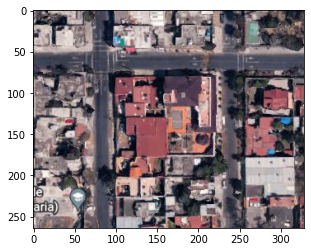

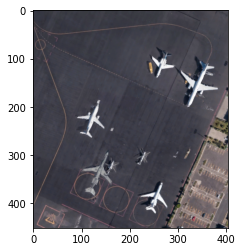

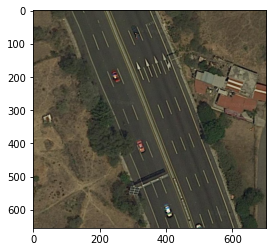

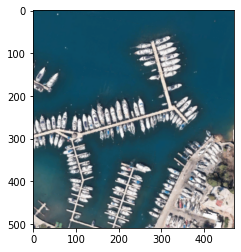

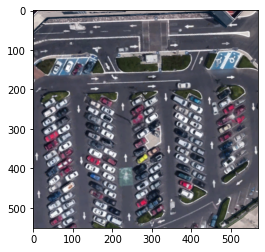

In [42]:
dir = pathlib.Path("/content/scig/ejemplos/")
dir_img = list(dir.glob(r"*.jpg"))
for n in range(0,len(dir_img)):
    img = imread(dir_img[n])
    plt.imshow(img)
    plt.show()

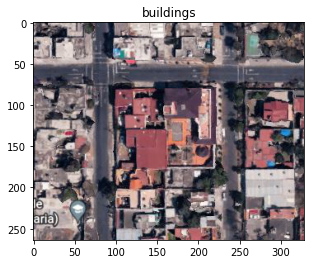

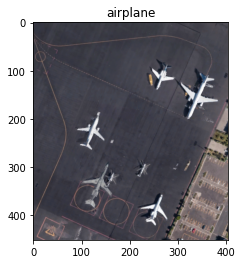

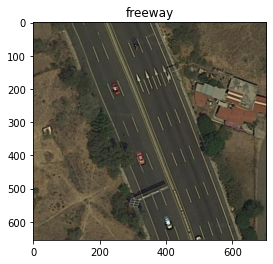

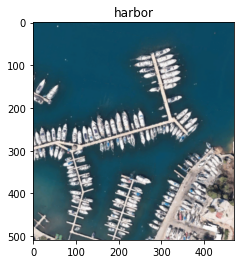

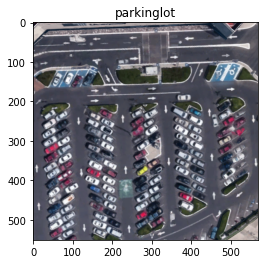

In [43]:
for n in range(0,len(dir_img)):
    img = imread(dir_img[n])
    img_resized = cv2.resize(img,(256, 256))
    img2 = img_resized[:,:,:3]
    img_reshape = img2.reshape(1, 256, 256, 3)
    
    pred = modelo.predict(img_reshape)
    clase = np.argmax(pred, axis = 1)
    
    plt.imshow(img)
    plt.title(dir_labels[clase[0]])
    plt.show()